![](https://raw.githubusercontent.com/jbottala02/CSC_126-2025/refs/heads/main/CSC-126%20GRAPHICS%20AND%20VISUAL%20COMPUTING.png)


# **Scaling, Re-sizing, Interpolations and Cropping**

**In this lesson we'll learn:**
1. How to re-size and scale images
2. Image Pyramids
3. Cropping

### **Re-sizing**

![](https://raw.githubusercontent.com/jbottala02/CSC_126-2025/refs/heads/main/Resizing.png)

Re-sizing is a simple function that we execute using the cv2.resize function, it's arguments are:

```cv2.resize(image, dsize(output image size), x scale, y scale, interpolation)```
- if dsize is None the output image is calculated as a function of scaling using x & y scale

#### **List of Interpolation Methods:**
- cv2.INTER_AREA - Good for shrinking or down sampling
- cv2.INTER_NEAREST - Fastest
- cv2.INTER_LINEAR - Good for zooming or up sampling (default)
- cv2.INTER_CUBIC - Better
- cv2.INTER_LANCZOS4 - Best

In [37]:
# Our Setup, Import Libaries, Create our Imshow Function and Download our Images
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function
def imshow(title = "Image", image = None, size = 10):
    if image is None:
        print("Please enter a valid image")
        return
    # The line below is changed from w, h to h, w
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

# Download and unzip our images
!gdown --id 1qxuPaG5nqZF17Q2dZ6jmX516736yYoNv
!unzip -qq images.zip

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1qxuPaG5nqZF17Q2dZ6jmX516736yYoNv
From (redirected): https://drive.google.com/uc?id=1qxuPaG5nqZF17Q2dZ6jmX516736yYoNv&confirm=t&uuid=183aaa08-aaa3-4513-b8dc-99629407bdac
To: /content/images.zip
100% 29.6M/29.6M [00:00<00:00, 124MB/s]
replace images/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


### **Types of re-scaling Methods in OpenCV**

- **INTER_NEAREST** – a nearest-neighbor interpolation
- **INTER_LINEAR** – a bilinear interpolation (used by default)
- **INTER_AREA** – resampling using pixel area relation. It may be a preferred method for image decimation, as it gives moire’-free results. But when the image is zoomed, it is similar to theINTER_NEAREST method.
- **INTER_CUBIC** – a bicubic interpolation over 4×4 pixel neighborhood
- **INTER_LANCZOS4** – a Lanczos interpolation over 8×8 pixel neighborhood

See more on their performance - https://chadrick-kwag.net/cv2-resize-interpolation-methods/

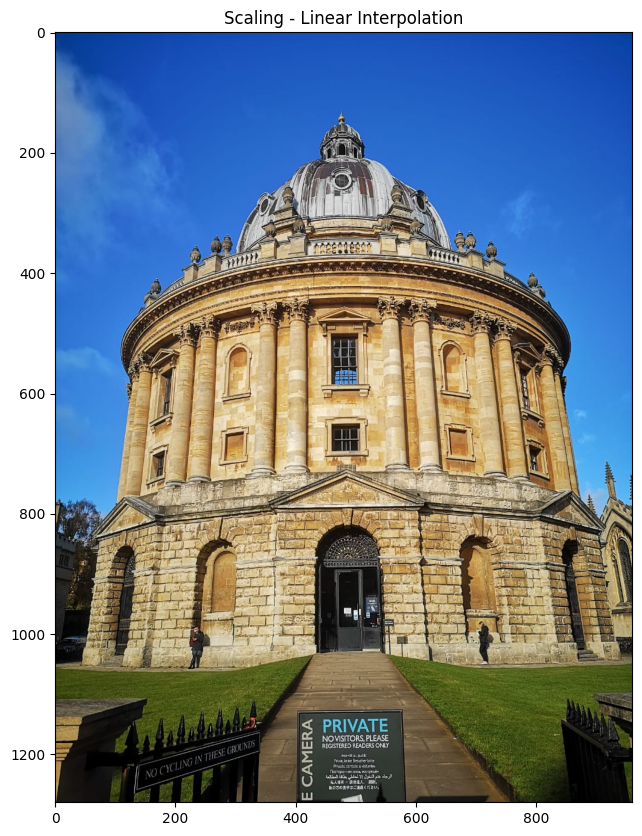

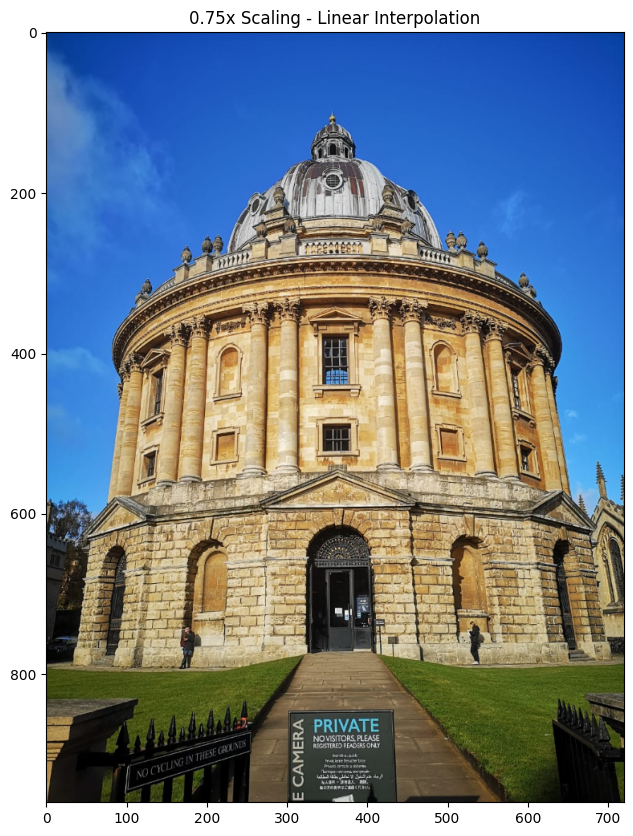

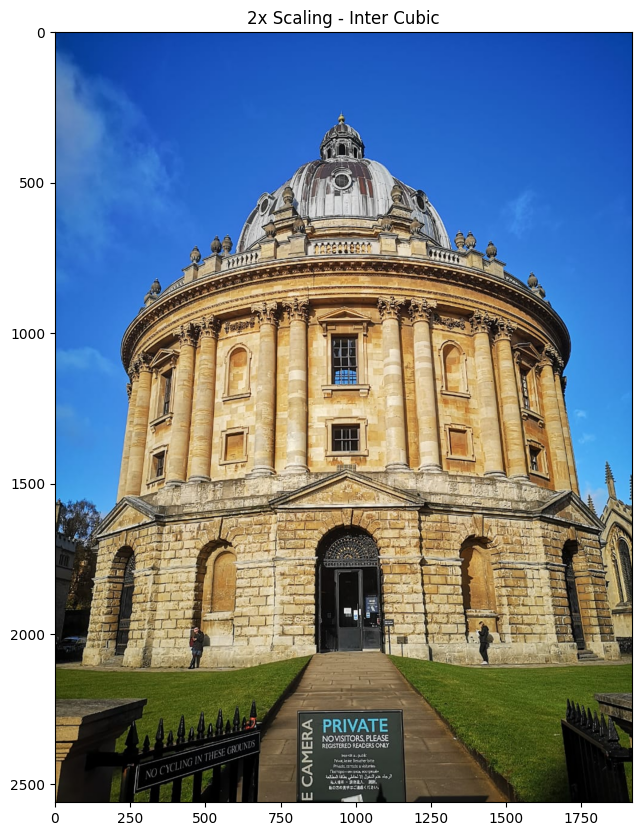

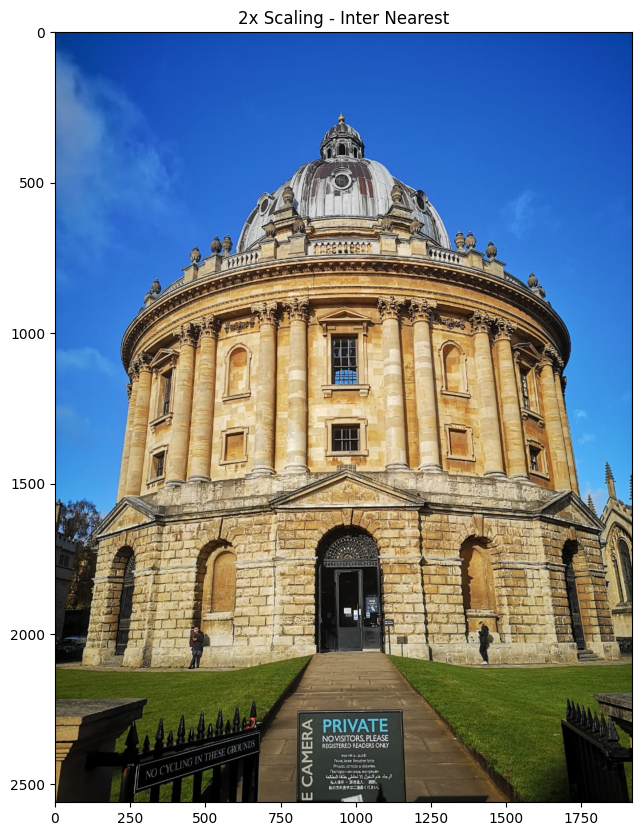

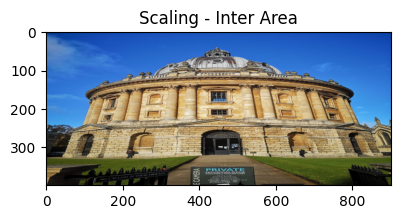

In [38]:
# load our input image
image = cv2.imread('images/oxfordlibrary.jpeg')
imshow("Scaling - Linear Interpolation", image)

# If no interpolation is specified cv.INTER_LINEAR is used as default
# Let's make our image 3/4 of it's original size
image_scaled = cv2.resize(image, None, fx=0.75, fy=0.75)
imshow("0.75x Scaling - Linear Interpolation", image_scaled)

# Let's double the size of our image
img_scaled2 = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_CUBIC)
imshow("2x Scaling - Inter Cubic", img_scaled2)

# Let's double the size of our image using inter_nearest interpolation
img_scaled3 = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_NEAREST)
imshow("2x Scaling - Inter Nearest", img_scaled3)

# Let's skew the re-sizing by setting exact dimensions
img_scaled4 = cv2.resize(image, (900, 400), interpolation = cv2.INTER_AREA)
imshow("Scaling - Inter Area", img_scaled4)

## **Image Pyraminds**

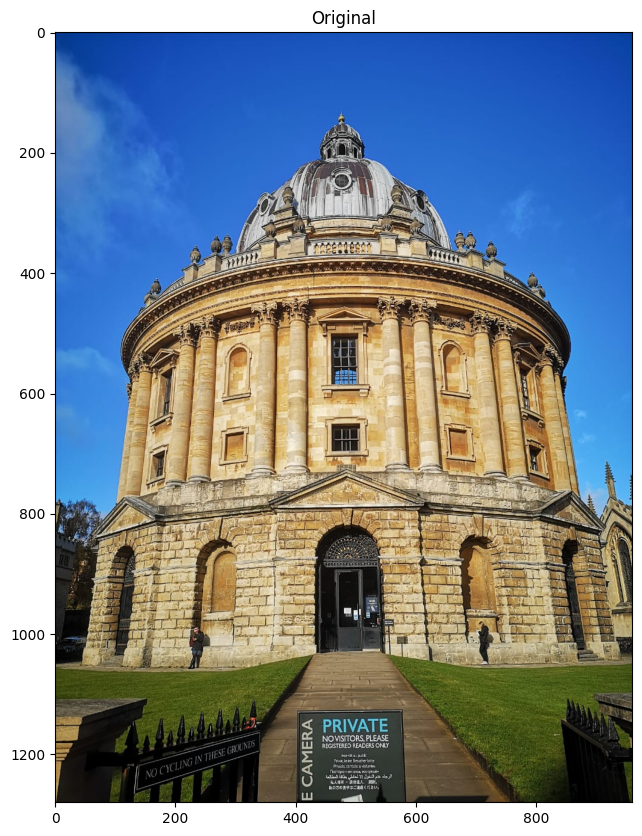

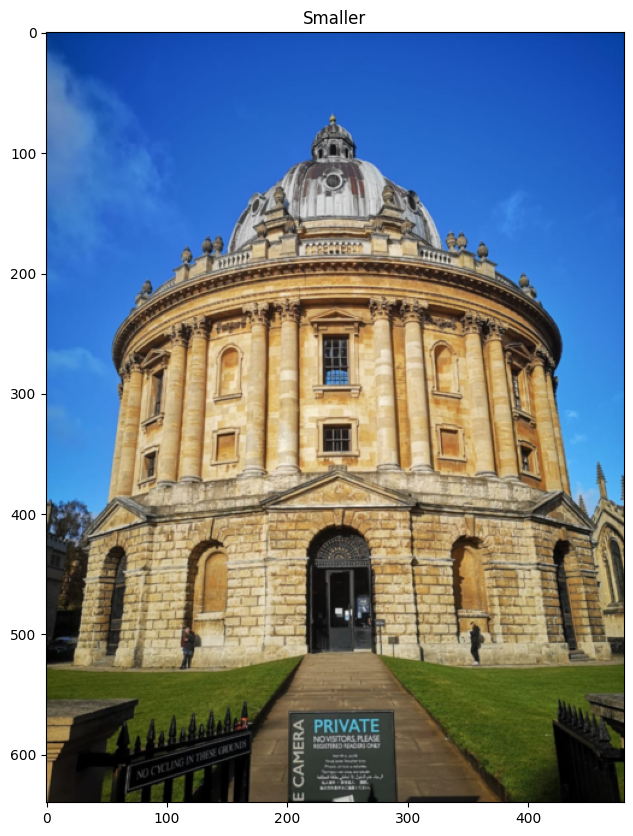

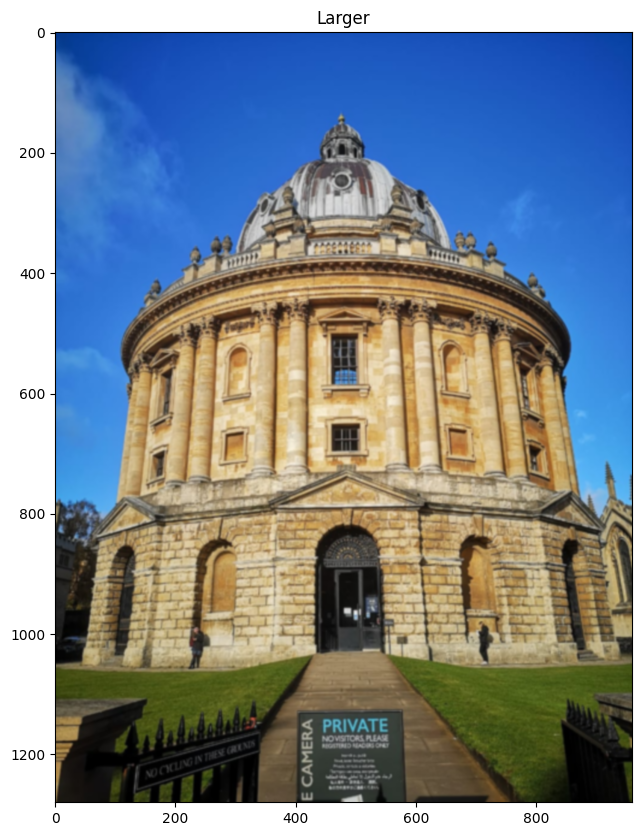

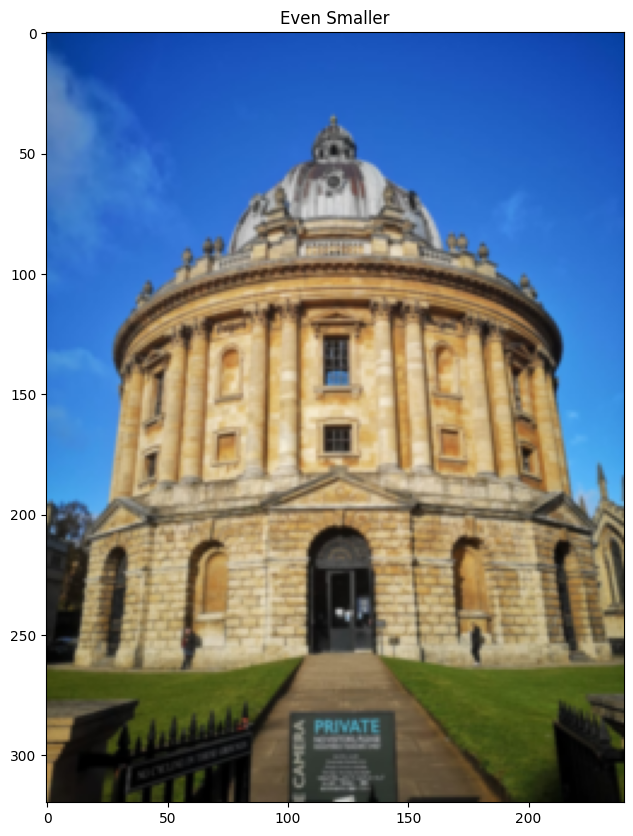

In [39]:
image = cv2.imread('images/oxfordlibrary.jpeg')

smaller = cv2.pyrDown(image)
larger = cv2.pyrUp(smaller)

imshow("Original", image)
imshow('Smaller', smaller)
imshow('Larger', larger)

even_smaller = cv2.pyrDown(smaller)
imshow('Even Smaller', even_smaller)

# **Cropping**

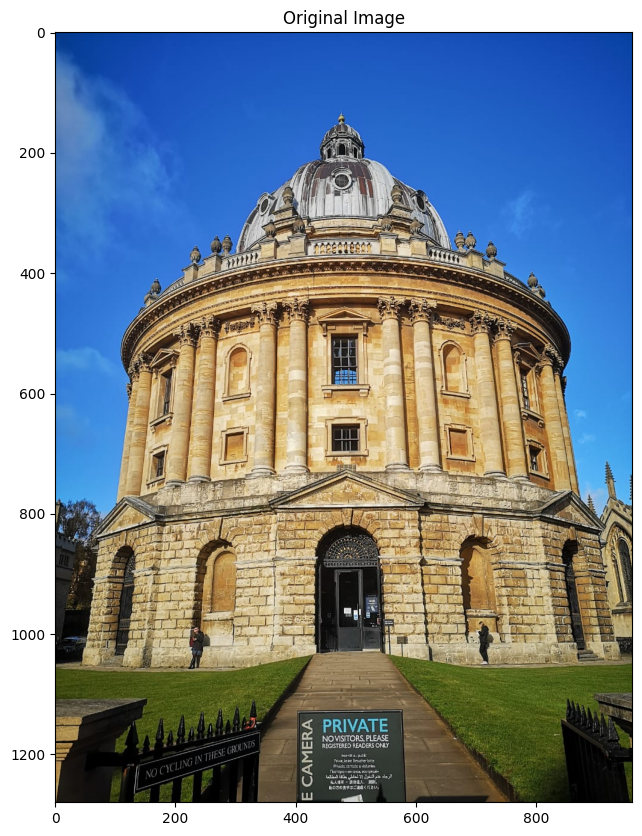

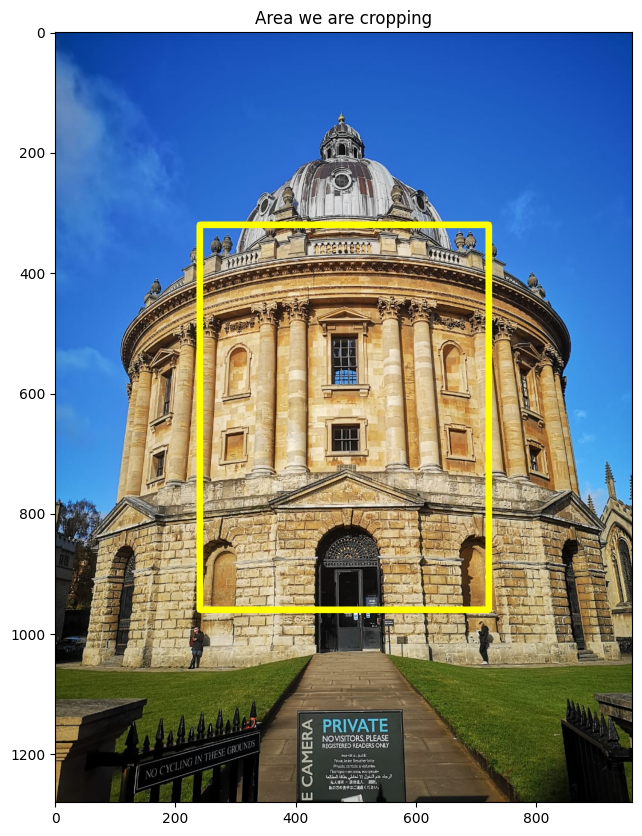

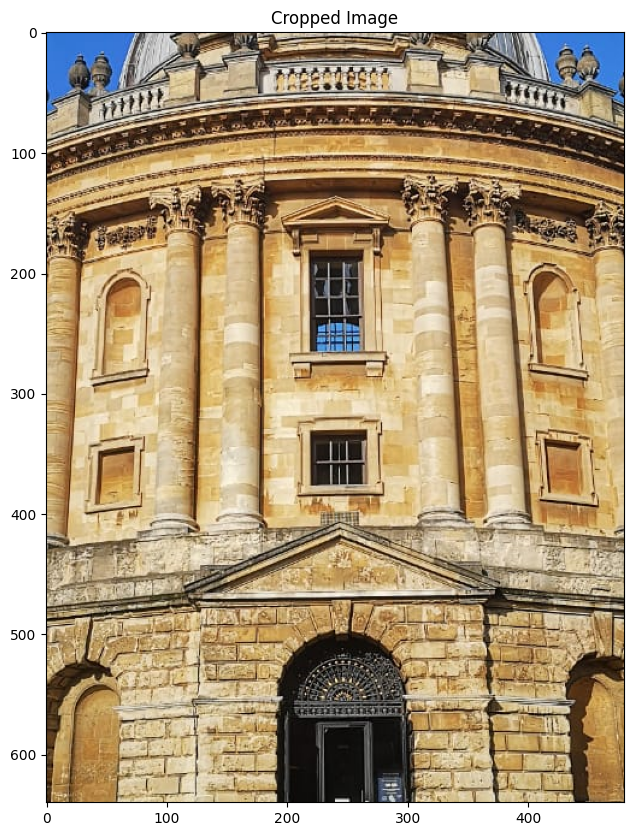

In [40]:
image = cv2.imread('images/oxfordlibrary.jpeg')

# Get our image dimensions
height, width = image.shape[:2]

# Let's get the starting pixel coordiantes (top  left of cropping rectangle)
# using 0.25 to get the x,y position that is 1/4 down from the top left (0,0)
start_row, start_col = int(height * .25), int(width * .25)

# Let's get the ending pixel coordinates (bottom right)
end_row, end_col = int(height * .75), int(width * .75)

# Simply use indexing to crop out the rectangle we desire
cropped = image[start_row:end_row , start_col:end_col]

imshow("Original Image", image)

# The cv2.rectangle function draws a rectangle over our image (in-place operation)
copy = image.copy()
cv2.rectangle(copy, (start_col,start_row), (end_col,end_row), (0,255,255), 10)

imshow("Area we are cropping", copy)

imshow("Cropped Image", cropped)


<style>
    body {
        font-family: 'Arial', sans-serif;
        background-color: #f4f4f4;
        margin: 0;
    }

    h1 {
        text-align: center;
        color: #333;
    }

    p {
        text-align: center;
        font-style: italic;
        color: #666;
        margin-top: 10px;
    }
</style>
<body>
    <h1>This is my tinkering</h1>
    <p>by Kian estrera DEF1</p>
</body>
</html>

In [41]:
!gdown --id 1HZSJNjuz7A1qpUqca6Agr0II2Mr5JJp7

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1HZSJNjuz7A1qpUqca6Agr0II2Mr5JJp7
To: /content/mrbean.jpg
100% 102k/102k [00:00<00:00, 79.6MB/s]


In [42]:
image = None
image = cv2.imread('/content/mrbean.jpg')

if image is None:
  print("Image failed to load!")
else:
  print("Image loaded successfully!")

Image loaded successfully!


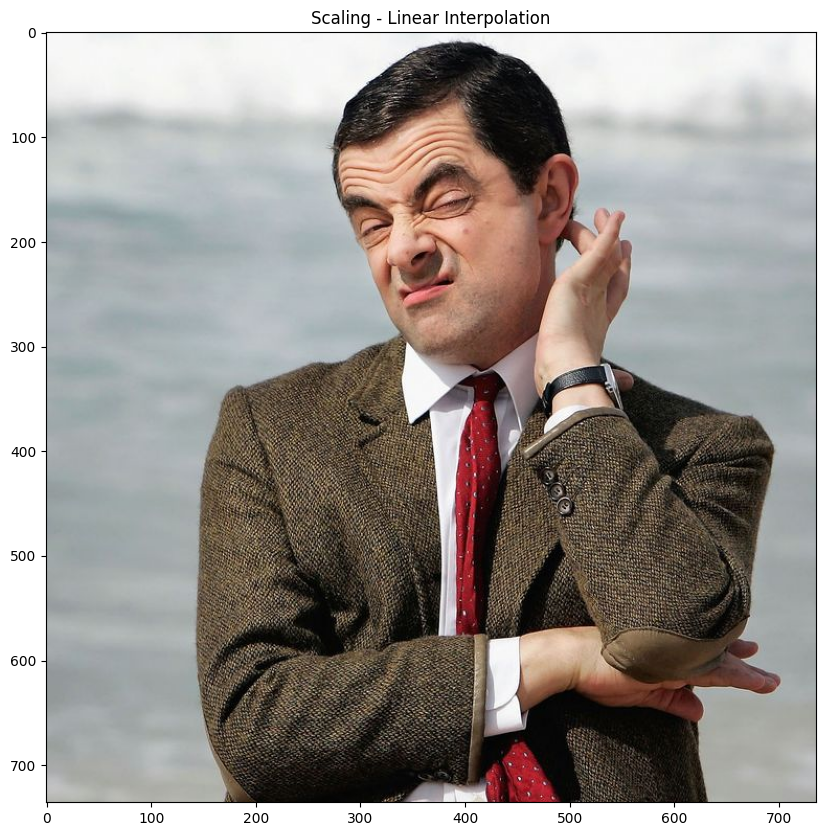

In [43]:

imshow("Scaling - Linear Interpolation", image)

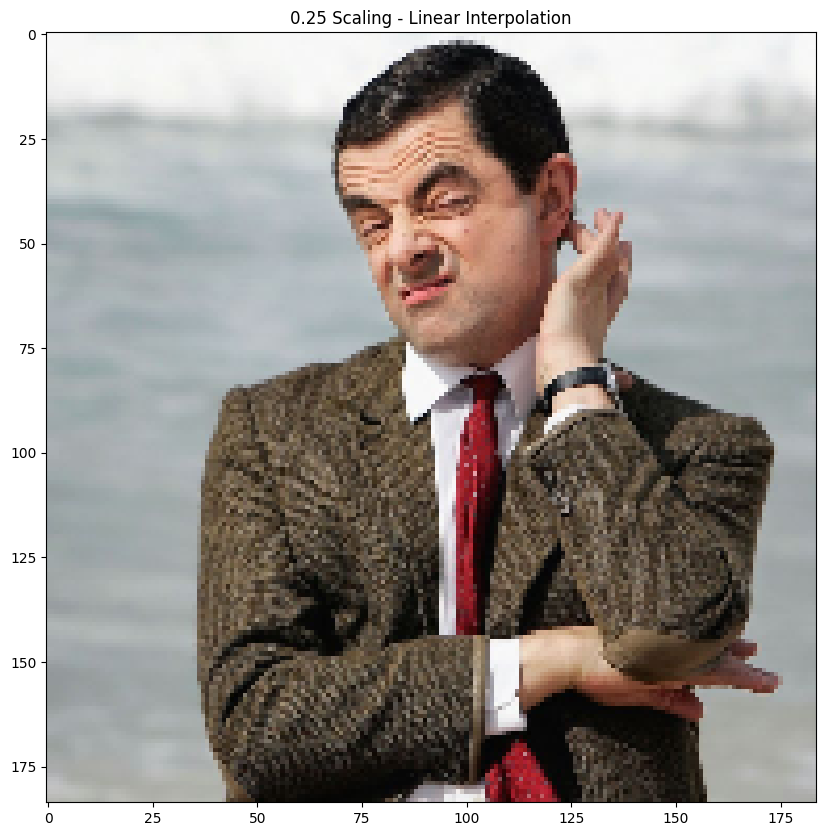

In [44]:

# If no interpolation is specified cv.INTER_LINEAR is used as default
# Let's make our image 0.25x of it's original size
image_scaled = cv2.resize(image, None, fx=0.25, fy=0.25)
imshow("0.25 Scaling - Linear Interpolation", image_scaled)

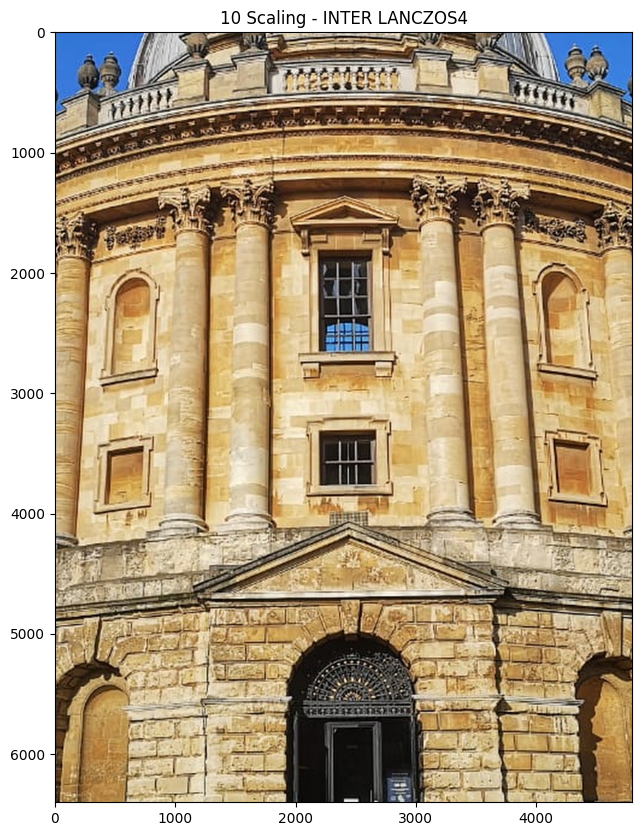

In [45]:

# 10 x the size with INTER LANCZOS4
cropped_scaled = cv2.resize(cropped, None, fx=10, fy=10, interpolation = cv2.INTER_LANCZOS4)
imshow("10 Scaling - INTER LANCZOS4", cropped_scaled)


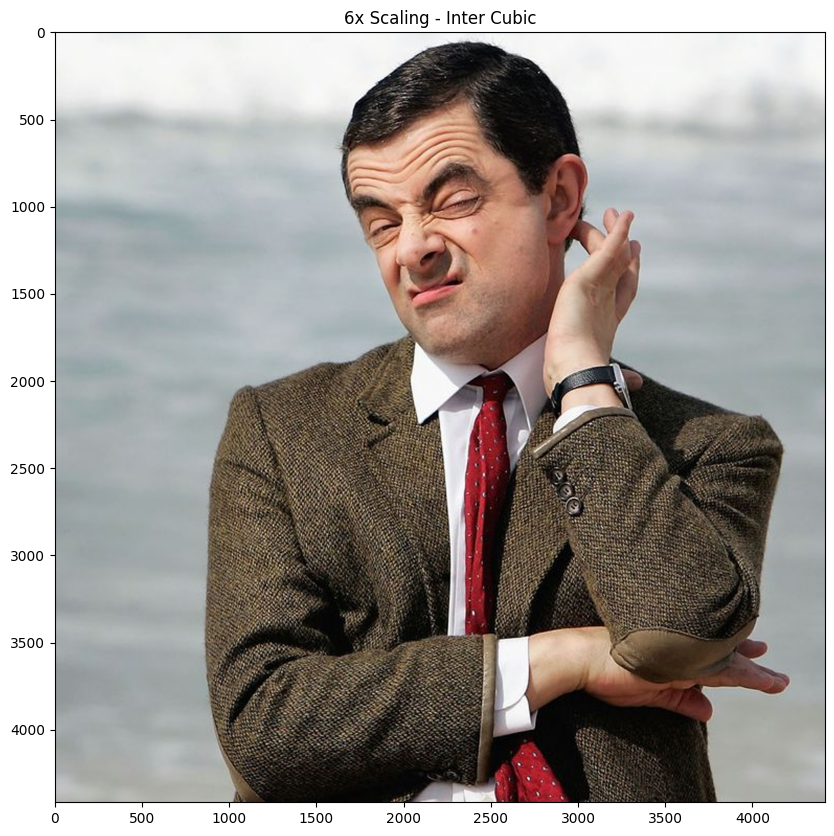

In [46]:

# Let's double the size of our image
img_scaled2 = cv2.resize(image, None, fx=6, fy=6, interpolation = cv2.INTER_CUBIC)
imshow("6x Scaling - Inter Cubic", img_scaled2)

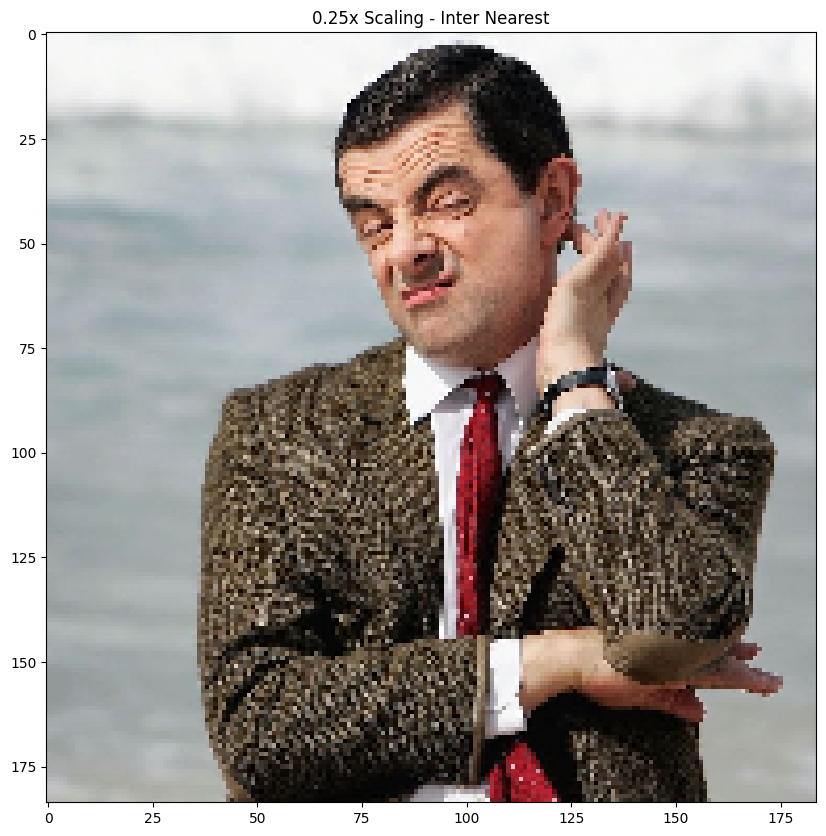

In [47]:


# Let's double the size of our image using inter_nearest interpolation
img_scaled3 = cv2.resize(image, None, fx=0.25, fy=0.25, interpolation = cv2.INTER_NEAREST)
imshow("0.25x Scaling - Inter Nearest", img_scaled3)

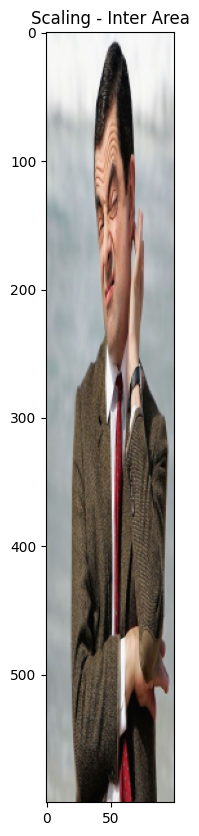

In [48]:


# Let's skew the re-sizing by setting exact dimensions
img_scaled4 = cv2.resize(image, (100, 600), interpolation = cv2.INTER_AREA)
imshow("Scaling - Inter Area", img_scaled4)

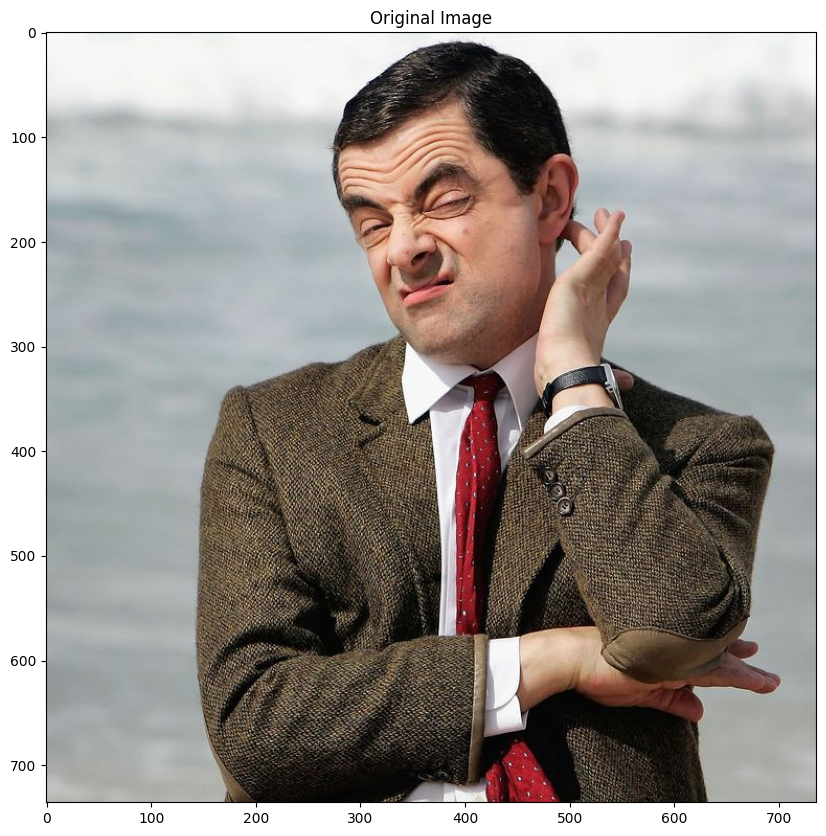

In [49]:


imshow("Original Image", image)

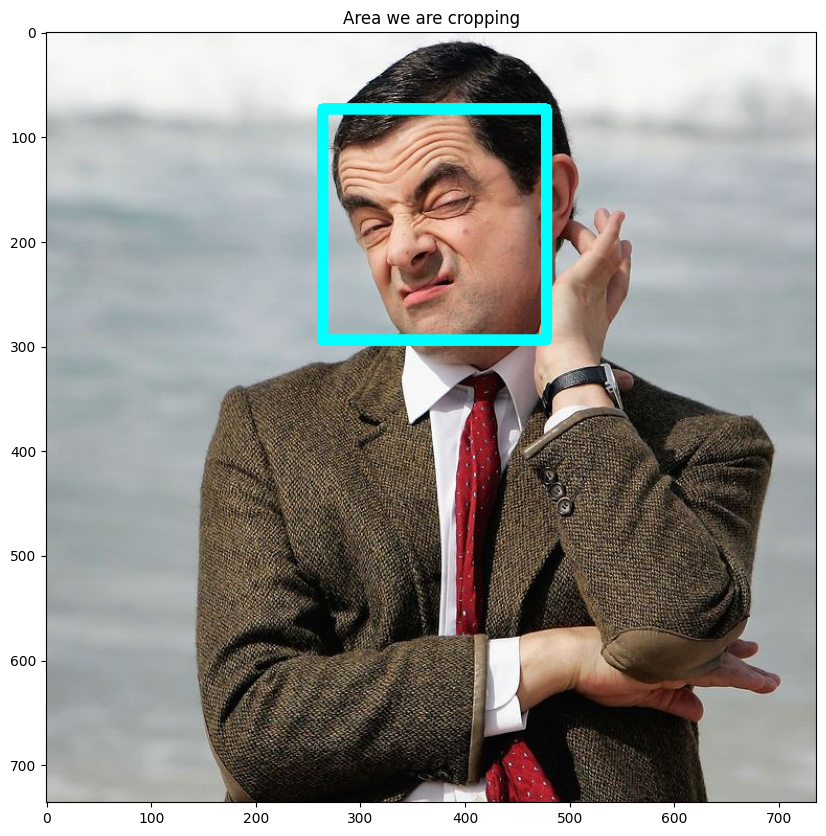

In [50]:

# Get our image dimensions
height, width = image.shape[:2]

# Let's get the starting pixel coordiantes (top  left of cropping rectangle)
# using 0.25 to get the x,y position that is 1/4 down from the top left (0,0)
start_row, start_col = int(height * .10), int(width * .36)

# Let's get the ending pixel coordinates (bottom right)
end_row, end_col = int(height * .40), int(width * .65)

# Simply use indexing to crop out the rectangle we desire
cropped = image[start_row:end_row , start_col:end_col]

# The cv2.rectangle function draws a rectangle over our image (in-place operation)
copy = image.copy()
cv2.rectangle(copy, (start_col,start_row), (end_col,end_row), (255,255,0), 10)

imshow("Area we are cropping", copy)

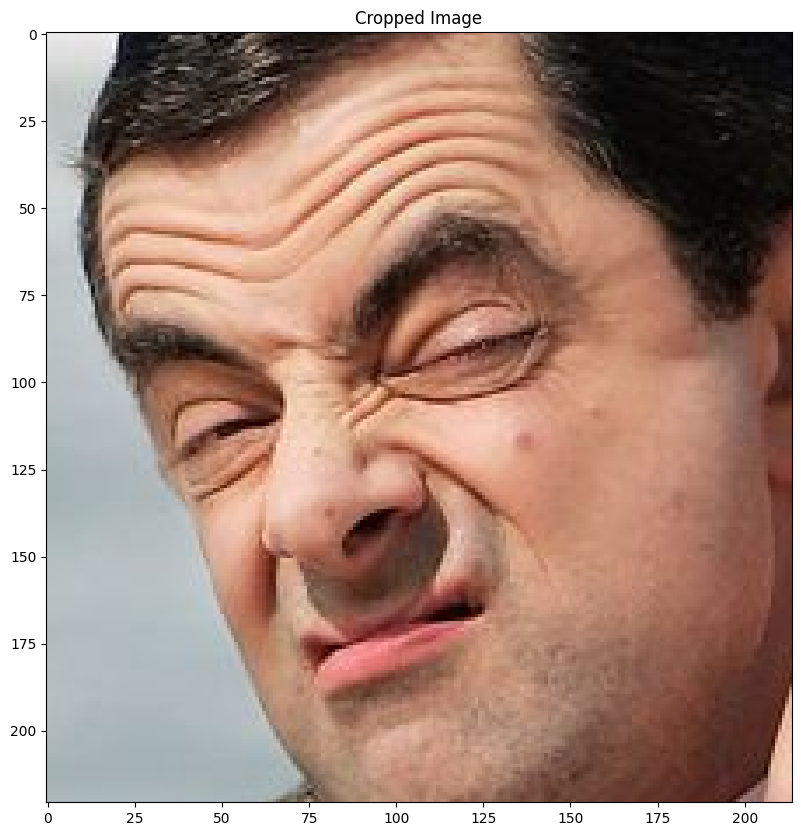

In [51]:


imshow("Cropped Image", cropped)

# **I cropped it to show the face, but it kinda blurry**

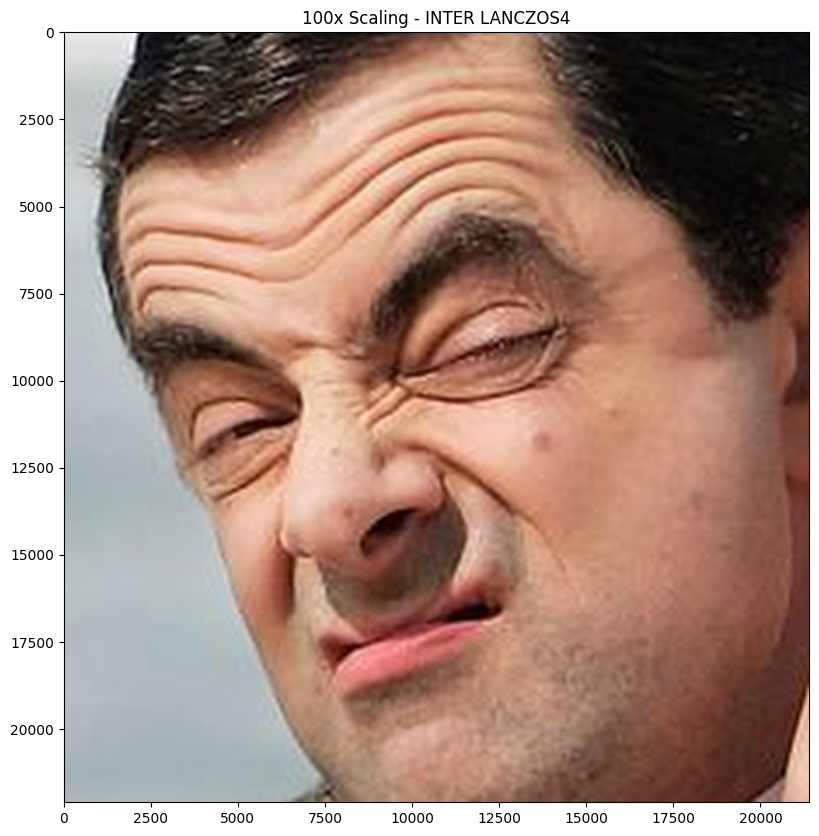

In [52]:

cropped_scaled = cv2.resize(cropped, None, fx=100, fy=100, interpolation = cv2.INTER_LANCZOS4)
imshow("100x Scaling - INTER LANCZOS4", cropped_scaled)

# **Hahaha I even use INTER LANCZOS4 to fix the blurry**